In [1]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [2]:
!pip install pytesseract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.2 MB 26.4 MB/s 
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2


In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import struct
from xml.dom import minidom
from xml.etree import ElementTree as eltree
import pandas as pd
from tqdm import tqdm
from shutil import copyfile
from PIL import Image, ImageDraw
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Input, Dense, Conv2D, Activation, Dropout, Layer, UpSampling2D, Conv2DTranspose, Concatenate
from tensorflow.keras.applications import VGG19, DenseNet121, MobileNetV3Large, EfficientNetB0, Xception, ResNet50
import pytesseract
import graphviz

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install unrar

In [3]:
!pip install --upgrade --no-cache-dir gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0


In [4]:
!gdown 1gfQb0s0VqVkc8yWMLtgc6nlAsvN4579Q
!unrar x /content/data.rar

Streaming output truncated to the last 5000 lines.
Extracting  data/ICDAR 2017/Images/POD_0594.bmp                           27%  OK 
Extracting  data/ICDAR 2017/Images/POD_0595.bmp                           27%  OK 
Extracting  data/ICDAR 2017/Images/POD_0596.bmp                           27%  OK 
Extracting  data/ICDAR 2017/Images/POD_0597.bmp                           27%  OK 
Extracting  data/ICDAR 2017/Images/POD_0598.bmp                           27%  OK 
Extracting  data/ICDAR 2017/Images/POD_0599.bmp                           27%  OK 
Extracting  data/ICDAR 2017/Images/POD_0600.bmp                           27%  OK 
Extracting  data/ICDAR 2017/Images/POD_0601.bmp                           27%  OK 
Extracting  data/ICDAR 2017/Images/POD_0602.bmp                           27%  OK 
Extracting  data/ICDAR 2017/Images/POD_0603.bmp                           27%  OK 
Extracting  data/ICDAR 2017/I

### Pre Processing

In [5]:
data_dir = os.path.join('/content/data/marmot_dataset_v1.0/data/English')
data_dir_extended = os.path.join('/content/data/marmot_extended')
bmp_files = [i for i in os.listdir(data_dir_extended) if i.endswith('bmp')]
xml_files_columns = [i for i in os.listdir(data_dir_extended) if i.endswith('xml')]
xml_files_tables = [f for f in os.listdir(os.path.join(data_dir, 'Positive', 'Labeled'))]
print("Number of .bmp files : ", len(bmp_files))
print("Number of .bmp files that have table annotations : ", len(xml_files_tables))
print("Number of .bmp files that have column annotations : ", len(xml_files_columns))
bmp_files = [i.replace('xml', 'bmp') for i in xml_files_columns]
xml_files_tables = [i.replace('bmp', 'xml') for i in bmp_files]
print("Number of final .bmp files : ", len(bmp_files))
print("Number of final .bmp files that have table annotations : ", len(xml_files_tables))
#xml_files_tables = [f for f in os.listdir(os.path.join(data_dir, 'Positive', 'Labeled')) if f in xml_files_columns]
#print("Number of .xml files for tables : ", len(xml_files_tables))

Number of .bmp files :  509
Number of .bmp files that have table annotations :  509
Number of .bmp files that have column annotations :  495
Number of final .bmp files :  495
Number of final .bmp files that have table annotations :  495


In [6]:
def hex2double(hexcode):
    """
    Input: 16digit hexadecimal number
    Output: Equivalent floating point representation
    """
    return struct.unpack('!d', bytes.fromhex(hexcode))[0]


def return_bboxes_extended(xml):
    """
    Input: Annotated xml file of an image from the marmot extended dataset
    Output: Dimension of the image and the list of bounding boxes of table columns present in the image
    """
    xml_file = eltree.parse(xml)
    root = xml_file.getroot()
    bboxes = []
    width = int(root.findall('size')[0].findall('width')[0].text)
    height = int(root.findall('size')[0].findall('height')[0].text)
    for ele in root.findall('object'):
        if ele.find('name').text == 'column':
            bbox = ele.find('bndbox')
            left = int(bbox.find('xmin').text)
            right = int(bbox.find('xmax').text)
            top = int(bbox.find('ymin').text)
            bottom = int(bbox.find('ymax').text)
        bboxes.append([left, top, right, bottom])
    return width, height, bboxes


def return_bboxes_v1(xml, width, height):
    """
    Input: Annotated xml file of an image from the marmot v1.0 dataset
    Output: The list of bounding boxes of tables present in the image
    """
    xml_file = eltree.parse(xml)
    root = xml_file.getroot()
    left, bottom, right, top = (hex2double(i) for i in root.get('CropBox').split())
    pa_width = np.abs(left - right)
    pa_height = np.abs(top - bottom)
    bboxes = []
    for each_table_comp in xml_file.findall(".//Composite[@Label='Table']"):
        t_left, t_bottom, t_right, t_top = [hex2double(i) for i in each_table_comp.get('BBox').split()]
        t_left = int(width/pa_width * np.abs(t_left - left))
        t_right = int(width/pa_width * np.abs(t_right - left))
        t_bottom = int(height/pa_height * np.abs(t_bottom - bottom))
        t_top = int(height/pa_height * np.abs(t_top - bottom))
        bboxes.append([t_left, t_top, t_right, t_bottom])
    return bboxes


def create_mask(img_path, list_of_bboxes, dim, mode='table'):
    """
    Input: Image, its corresponding list of bounding boxes, dimension of the image
    and mode specifying the annotation type (table/column)
    Output: Create corresponding mask image (containing the boxes) and return the mask file path
    """
    data_dir = os.path.join('/content/data', 'marmot_masked')
    image_dir = os.path.join(data_dir, 'images')
    mask_dir = os.path.join(data_dir, 'masks', mode)
    if not os.path.exists(data_dir):
        os.makedirs(data_dir)
    if not os.path.exists(image_dir):
        os.makedirs(image_dir)
    if not os.path.exists(mask_dir):
        os.makedirs(mask_dir)
    fname = img_path.split(os.path.sep)[-1].replace('bmp', 'png')
    dest = os.path.join(image_dir, fname)
    if mode == 'table':
        img = Image.open(img_path)
        img.save(dest, 'png')
    image = Image.new("RGB", dim)
    mask = ImageDraw.Draw(image)
    for each_list in list_of_bboxes:
        mask.rectangle(each_list, fill=255)
    mask_fn = os.path.join(mask_dir, fname)
    image = np.array(image)
    image = Image.fromarray(image[:,:,0])
    image.save(mask_fn)
    if mode == 'table':
        return dest, mask_fn
    return mask_fn


def compute_masks():
    """
    Returns a pandas dataframe containing the imagepath and mask_path and dimension.
    It invokes the above two methods to create corresponding mask images
    """
    images_dir = os.path.join('/content/data/marmot_extended')
    img_file_list = [i for i in os.listdir(images_dir) if i.endswith('bmp')]
    img_df = pd.DataFrame(columns=['image_path', 'image_dim', 'tablemask_path', 'columnmask_path'])
    for each_image in tqdm(img_file_list):
        img_path = os.path.join(images_dir, each_image)
        table_annot = os.path.join('/content/data/marmot_dataset_v1.0/data/English/Positive/Labeled', each_image.replace('bmp', 'xml'))
        column_annot = img_path.replace('bmp', 'xml')
        if not os.path.exists(column_annot):
            continue
        width, height, column_bboxes = return_bboxes_extended(column_annot)
        dim = (width, height)
        table_bboxes = return_bboxes_v1(table_annot, width, height)
        image_path, table_mask_path = create_mask(img_path, table_bboxes, dim, mode='table')
        column_mask_path = create_mask(img_path, column_bboxes, dim, mode='column')
        img_df.loc[len(img_df.index)] = [image_path, dim, table_mask_path, column_mask_path]
        csv_fname = os.path.join('/content/data', 'marmot_masked', 'data.csv')
        img_df.to_csv(csv_fname, index=False)
    return img_df

In [7]:
img_df = compute_masks()

100%|██████████| 509/509 [00:46<00:00, 11.04it/s]


In [8]:
data_dir = os.path.join('/content/data/ICDAR 2017')
print('Number of images : ', len(os.listdir(os.path.join(data_dir, 'Images'))))

Number of images :  1600


### Model definition

In [9]:
def _parse_function(image, mask, colmask):
    dim = (512,512)
    image_decoded = tf.io.decode_png(tf.io.read_file(image), channels=3)
    image = tf.cast(image_decoded, tf.float32)
    image = tf.image.resize(image, dim)
    image = tf.cast(image, tf.float32) / 255.0

    mask_decoded = tf.io.decode_png(tf.io.read_file(mask), channels=1)
    mask = tf.cast(mask_decoded, tf.float32)
    mask = tf.image.resize(mask, dim)
    mask = tf.cast(mask, tf.float32) / 255.0

    colmask_decoded = tf.io.decode_png(tf.io.read_file(colmask), channels=1)
    colmask = tf.cast(colmask_decoded, tf.float32)
    colmask = tf.image.resize(colmask, dim)
    colmask = tf.cast(colmask, tf.float32) / 255.0

    mask_dict = {'table': mask, 'column': colmask}

    return image, mask_dict

# function to display a list of images
def visualize(image_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'Table Mask', 'Column Mask']
    for i in range(len(image_list)):
        plt.subplot(1, len(image_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image_list[i]))
        plt.axis('off')
    plt.show()

# visualizing initial predictions (without training)
def render(mask):
    mask = tf.argmax(mask, axis=-1)
    mask = mask[..., tf.newaxis]
    return mask[0]

In [10]:
# defining data directory and reading data
tr_data_dir = os.path.join('/content/data', 'marmot_masked')
train_df = pd.read_csv(os.path.join(tr_data_dir, 'data.csv'))
#defining tensorflow dataset
tf.keras.backend.clear_session()
dataset = tf.data.Dataset.from_tensor_slices((train_df['image_path'].values, train_df['tablemask_path'].values, train_df['columnmask_path'].values))

In [11]:
# defining training parameters
DATA_SIZE = len(dataset)
VAL_SIZE = 0.1
VAL_LENGTH = int(VAL_SIZE * DATA_SIZE)
TRAIN_LENGTH = int((1 - VAL_SIZE) * DATA_SIZE)
BATCH_SIZE = 1
BUFFER_SIZE = TRAIN_LENGTH
VAL_BUFFER_SIZE = VAL_LENGTH
VALIDATION_STEPS = VAL_LENGTH // BATCH_SIZE
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
# defining data loading mechanisms
train = dataset.take(TRAIN_LENGTH)
val = dataset.skip(TRAIN_LENGTH)
train = train.map(_parse_function)
val = val.map(_parse_function)
train_dataset = train.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
val_dataset = val.shuffle(VAL_BUFFER_SIZE).batch(BATCH_SIZE)

In [12]:
# defining custom layers and model building function
class TableConvLayer(Layer):
    def __init__(self, name='table'):
        super(TableConvLayer, self).__init__(name=name)
        self.conv7 = Conv2D(512, (1,1), activation='relu', name='conv7table')
        self.upsample_conv7 = UpSampling2D((2,2))
        self.concat_p4 = Concatenate()
        self.upsample_p4 = UpSampling2D((2,2))

        self.concat_p3 = Concatenate()
        self.upsample_p3 = UpSampling2D((2,2))

        self.upsample_p3_2 = UpSampling2D((2,2))
        self.convtranspose = Conv2DTranspose(3, (3,3), strides=2, padding='same')

    def call(self, inputs):
        X, pool3, pool4 = inputs
        X = self.conv7(X)
        X = self.upsample_conv7(X)

        X = self.concat_p4([X, pool4])
        X = self.upsample_p4(X)
        X = self.concat_p3([X, pool3])
        X = self.upsample_p3(X)
        X = self.upsample_p3_2(X)
        X = self.convtranspose(X)

        return X


class ColumnConvLayer(Layer):
    def __init__(self, name='column'):
        super(ColumnConvLayer, self).__init__(name=name)
        self.conv7 = Conv2D(512, (1,1), activation='relu', name='conv7column')
        self.dropout = Dropout(0.8)
        self.conv8 = Conv2D(512, (1,1), activation='relu', name='conv8column')
        self.upsample_conv8 = UpSampling2D((2,2))
        self.concat_p4 = Concatenate()
        self.upsample_p4 = UpSampling2D((2,2))

        self.concat_p3 = Concatenate()
        self.upsample_p3 = UpSampling2D((2,2))

        self.upsample_p3_2 = UpSampling2D((2,2))
        self.convtranspose = Conv2DTranspose(3, (3,3), strides=2, padding='same')


    def call(self, inputs):
        X, pool3, pool4 = inputs
        X = self.conv7(X)
        X = self.dropout(X)
        X = self.conv8(X)
        X = self.upsample_conv8(X)
        X = self.concat_p4([X, pool4])
        X = self.upsample_p4(X)
        X = self.concat_p3([X, pool3])
        X = self.upsample_p3(X)
        X = self.upsample_p3_2(X)
        X = self.convtranspose(X)

        return X


def build_tablenet(encoder='VGG19'):
    tf.keras.backend.clear_session()
    input_shape = (512,512,3)

    if encoder == 'VGG19':
        encoder_dict = {
            'base' : VGG19,
            'end_layers' :  ['block3_pool', 'block4_pool', 'block5_pool']
        }


    elif encoder == 'DenseNet121':
        encoder_dict = {
            'base' : DenseNet121,
            'end_layers' : ['pool3_pool','pool4_pool', 'relu']
        }

    elif encoder == 'EfficientNetB0':
        encoder_dict = {
            'base' : EfficientNetB0,
            'end_layers' : ['block5c_add','block6d_add', 'top_activation']
        }

    elif encoder == 'Xception':
        encoder_dict = {
            'base' : Xception,
            'end_layers' : ['block10_sepconv2_act','block12_sepconv2_act', 'block14_sepconv2_act']
        }

    elif encoder == 'ResNet50':
        encoder_dict = {
            'base' : ResNet50,
            'end_layers' : ['conv3_block4_3_conv','conv4_block6_3_conv', 'conv5_block3_out']
        }

    else:
        raise ValueError("Value of encoder must belong from [VGG19, DenseNet121, EfficientNetB0, Xception]")


    base = encoder_dict['base'](input_shape=input_shape, include_top=False, weights='imagenet')

    end_layers = [base.get_layer(i).output for i in encoder_dict['end_layers']]

    X = Conv2D(512, (1,1), activation='relu', name='block6_conv1')(end_layers[-1])
    X = Dropout(0.4)(X)
    X = Conv2D(512, (1,1), activation='relu', name='block6_conv2')(X)
    X = Dropout(0.4)(X)

    if encoder == 'VGG19':
        Y = end_layers[0]
        Z = end_layers[1]

    elif encoder == 'ResNet50':
        Y = Conv2D(256, (1,1))(end_layers[0])
        Z = Conv2D(512, (1,1))(end_layers[1])

    elif encoder == 'DenseNet121':
        Y = UpSampling2D((2,2))(end_layers[0])
        Z = UpSampling2D((2,2))(end_layers[1])


    elif encoder == 'EfficientNetB0':
        Y = UpSampling2D((2,2))(end_layers[0])
        Y = Conv2D(256, (1,1))(Y)
        Z = UpSampling2D((2,2))(end_layers[1])
        Z = Conv2D(512, (1,1))(Z)


    elif encoder == 'Xception':
        Y = UpSampling2D((2,2))(end_layers[0])
        Y = Conv2D(256, (1,1))(Y)
        Z = Conv2D(512, (1,1))(end_layers[1])



    table_branch = TableConvLayer()([X, Y, Z])
    column_branch = ColumnConvLayer()([X, Y, Z])

    model = Model(inputs=base.input, outputs=[table_branch, column_branch], name='TableNet_' + encoder)

    losses = {
        "table": tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        "column": tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    }
    lossWeights = {"table": 1.0, "column": 1.0}
    optim = tf.keras.optimizers.Adam(learning_rate=0.0001, epsilon=1e-08)
    sc_acc = tf.keras.metrics.SparseCategoricalAccuracy(name='sc_accuracy')
    model.compile(optimizer = optim,
              loss = losses,
              metrics = [sc_acc],
              loss_weights = lossWeights)

    return model

In [ ]:
pip install -q pyyaml h5py

In [13]:
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

def call_back(cpp, ld):
    checkpoint_path = cpp
    checkpoint_dir = os.path.dirname(checkpoint_path)
    log_dir = ld
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    if not os.path.exists(log_dir):
        os.makedirs(log_dir)
    cp_callback = ModelCheckpoint(checkpoint_path, verbose=1, save_best_only=True, monitor='val_loss', save_weights_only=True)
    tb_callback = TensorBoard(log_dir)
    lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-10)
    es_callback = EarlyStopping(monitor='val_loss', patience=10)
    callbacks = [cp_callback, tb_callback, lr_callback, es_callback]
    return callbacks

### Compairing Encoders

#### VGG19

In [15]:
callbacks = call_back("/content/drive/MyDrive/tablenet_weights/cp_{epoch:04d}_{val_loss:.4f}.ckpt", "tablenet_logs")
#callbacks = call_back("/content/drive/MyDrive/tablenet_weights", "tablenet_logs")
model = build_tablenet(encoder='VGG19')
#model = tf.keras.models.load_model('/content/drive/MyDrive/tablenet_weights/saved_model.pb')
#tf.keras.models.save_model(model, 'New_Model.h5')
#model = tf.keras.models.load_model('New_Model.h5')
model.fit(
    train_dataset, epochs=30,
    steps_per_epoch= STEPS_PER_EPOCH,
    validation_data=val_dataset,
    validation_steps= VALIDATION_STEPS,
    callbacks=callbacks
)

80134624/80134624 [==============================] - 5s 0us/step
Epoch 1/30
444/444 [==============================] - ETA: 0s - loss: 0.5783 - table_loss: 0.3281 - column_loss: 0.2502 - table_sc_accuracy: 0.8714 - column_sc_accuracy: 0.9033
Epoch 1: val_loss improved from inf to 0.40368, saving model to /content/drive/MyDrive/tablenet_weights/cp_0001_0.4037.ckpt
444/444 [==============================] - 108s 197ms/step - loss: 0.5783 - table_loss: 0.3281 - column_loss: 0.2502 - table_sc_accuracy: 0.8714 - column_sc_accuracy: 0.9033 - val_loss: 0.4037 - val_table_loss: 0.2265 - val_column_loss: 0.1772 - val_table_sc_accuracy: 0.9093 - val_column_sc_accuracy: 0.9270 - lr: 1.0000e-04
Epoch 2/30
444/444 [==============================] - ETA: 0s - loss: 0.3772 - table_loss: 0.2168 - column_loss: 0.1603 - table_sc_accuracy: 0.9120 - column_sc_accuracy: 0.9321
Epoch 2: val_loss improved from 0.40368 to 0.32036, saving model to /content/drive/MyDrive/tablenet_weights/cp_0002_0.3204.ckpt
444

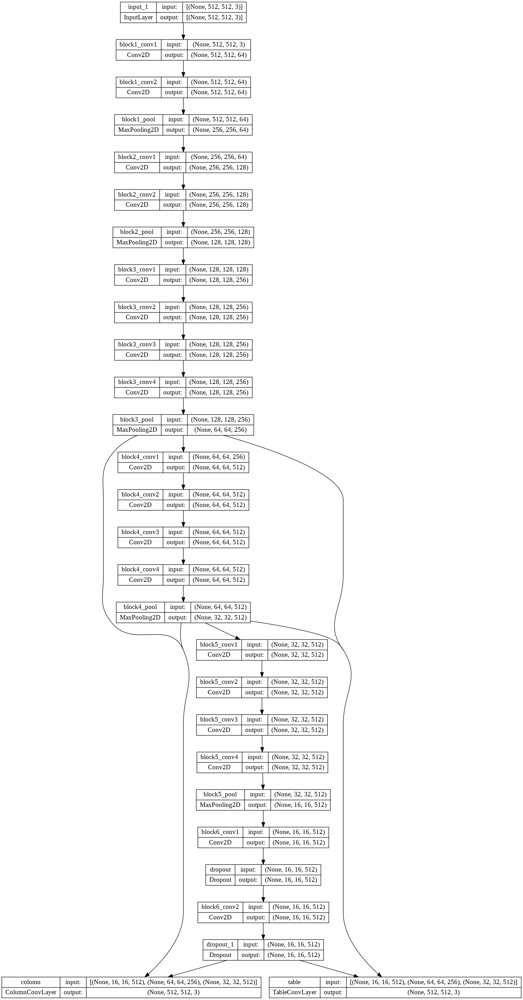

In [16]:
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_names=True)

In [17]:
model.summary()

Model: "TableNet_VGG19"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 512, 512, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 512, 512, 64  36928       ['block1_conv1[0][0]']           
                                )                                                    

#### DenseNet121

In [18]:
callbacks = call_back("/content/drive/MyDrive/tablenet_DenseNet_weights/cp_{epoch:04d}_{val_loss:.4f}.ckpt", "tablenet_DenseNet_logs")
model = build_tablenet(encoder='DenseNet121')
model.fit(
    train_dataset, epochs=15,
    steps_per_epoch= STEPS_PER_EPOCH,
    validation_data=val_dataset,
    validation_steps= VALIDATION_STEPS,
    callbacks=callbacks
)

29084464/29084464 [==============================] - 2s 0us/step
Epoch 1/30
444/444 [==============================] - ETA: 0s - loss: 0.5020 - table_loss: 0.2777 - column_loss: 0.2243 - table_sc_accuracy: 0.8876 - column_sc_accuracy: 0.9006
Epoch 1: val_loss improved from inf to 0.84975, saving model to /content/drive/MyDrive/tablenet_DenseNet_weights/cp_0001_0.8497.ckpt
444/444 [==============================] - 90s 152ms/step - loss: 0.5020 - table_loss: 0.2777 - column_loss: 0.2243 - table_sc_accuracy: 0.8876 - column_sc_accuracy: 0.9006 - val_loss: 0.8497 - val_table_loss: 0.3866 - val_column_loss: 0.4631 - val_table_sc_accuracy: 0.8340 - val_column_sc_accuracy: 0.8227 - lr: 1.0000e-04
Epoch 2/30
444/444 [==============================] - ETA: 0s - loss: 0.3166 - table_loss: 0.1734 - column_loss: 0.1432 - table_sc_accuracy: 0.9324 - column_sc_accuracy: 0.9332
Epoch 2: val_loss improved from 0.84975 to 0.36964, saving model to /content/drive/MyDrive/tablenet_DenseNet_weights/cp_000

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.685918 to fit



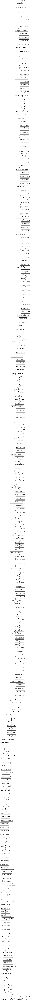

In [19]:
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_names=True)

In [20]:
model.summary()

Model: "TableNet_DenseNet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 518, 518, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 256, 256, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                               

#### ResNet50

In [21]:
callbacks = call_back("/content/drive/MyDrive/tablenet_ResNet_weights/cp_{epoch:04d}_{val_loss:.4f}.ckpt", "tablenet_ResNet_logs")
model = build_tablenet(encoder='ResNet50')
model.fit(
    train_dataset, epochs=15,
    steps_per_epoch= STEPS_PER_EPOCH,
    validation_data=val_dataset,
    validation_steps= VALIDATION_STEPS,
    callbacks=callbacks
)

94765736/94765736 [==============================] - 5s 0us/step
Epoch 1/20
444/444 [==============================] - ETA: 0s - loss: 0.4794 - table_loss: 0.2731 - column_loss: 0.2063 - table_sc_accuracy: 0.8907 - column_sc_accuracy: 0.9151
Epoch 1: val_loss improved from inf to 1.14810, saving model to /content/drive/MyDrive/tablenet_ResNet_weights/cp_0001_1.1481.ckpt
444/444 [==============================] - 84s 155ms/step - loss: 0.4794 - table_loss: 0.2731 - column_loss: 0.2063 - table_sc_accuracy: 0.8907 - column_sc_accuracy: 0.9151 - val_loss: 1.1481 - val_table_loss: 0.7548 - val_column_loss: 0.3933 - val_table_sc_accuracy: 0.7850 - val_column_sc_accuracy: 0.8691 - lr: 1.0000e-04
Epoch 2/20
444/444 [==============================] - ETA: 0s - loss: 0.2600 - table_loss: 0.1521 - column_loss: 0.1079 - table_sc_accuracy: 0.9423 - column_sc_accuracy: 0.9503
Epoch 2: val_loss improved from 1.14810 to 0.46554, saving model to /content/drive/MyDrive/tablenet_ResNet_weights/cp_0002_0.

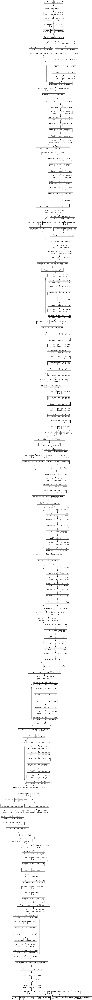

In [22]:
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_names=True)

In [23]:
model.summary()

Model: "TableNet_ResNet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 518, 518, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 256, 256, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                  

#### EfficientNetB0

In [24]:
callbacks = call_back("/content/drive/MyDrive/tablenet_EfficientNet_weights/cp_{epoch:04d}_{val_loss:.4f}.ckpt", "tablenet_EfficientNet_logs")
model = build_tablenet(encoder='EfficientNetB0')
model.fit(
    train_dataset, epochs=15,
    steps_per_epoch= STEPS_PER_EPOCH,
    validation_data=val_dataset,
    validation_steps= VALIDATION_STEPS,
    callbacks=callbacks
)

16705208/16705208 [==============================] - 2s 0us/step
Epoch 1/20
444/444 [==============================] - ETA: 0s - loss: 0.6687 - table_loss: 0.3702 - column_loss: 0.2985 - table_sc_accuracy: 0.8622 - column_sc_accuracy: 0.8863
Epoch 1: val_loss improved from inf to 1.16267, saving model to /content/drive/MyDrive/tablenet_EfficientNet_weights/cp_0001_1.1627.ckpt
444/444 [==============================] - 84s 150ms/step - loss: 0.6687 - table_loss: 0.3702 - column_loss: 0.2985 - table_sc_accuracy: 0.8622 - column_sc_accuracy: 0.8863 - val_loss: 1.1627 - val_table_loss: 0.7568 - val_column_loss: 0.4059 - val_table_sc_accuracy: 0.7851 - val_column_sc_accuracy: 0.8724 - lr: 1.0000e-04
Epoch 2/20
444/444 [==============================] - ETA: 0s - loss: 0.3805 - table_loss: 0.2142 - column_loss: 0.1663 - table_sc_accuracy: 0.9181 - column_sc_accuracy: 0.9275
Epoch 2: val_loss did not improve from 1.16267
444/444 [==============================] - 72s 146ms/step - loss: 0.3805

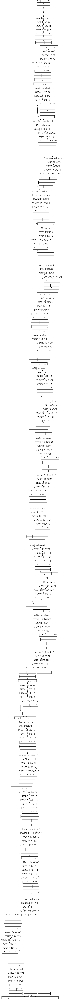

In [25]:
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_names=True)

In [26]:
model.summary()

Model: "TableNet_EfficientNetB0"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 512, 512, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 512, 512, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 512, 512, 3)  0           ['normaliza

#### Xception

In [27]:
callbacks = call_back("/content/drive/MyDrive/tablenet_Xception_weights/cp_{epoch:04d}_{val_loss:.4f}.ckpt", "tablenet_Xception_logs")
model = build_tablenet(encoder='Xception')
model.fit(
    train_dataset, epochs=15,
    steps_per_epoch= STEPS_PER_EPOCH,
    validation_data=val_dataset,
    validation_steps= VALIDATION_STEPS,
    callbacks=callbacks
)

83683744/83683744 [==============================] - 5s 0us/step
Epoch 1/20
444/444 [==============================] - ETA: 0s - loss: 0.4665 - table_loss: 0.2592 - column_loss: 0.2073 - table_sc_accuracy: 0.8981 - column_sc_accuracy: 0.9116
Epoch 1: val_loss improved from inf to 0.36474, saving model to /content/drive/MyDrive/tablenet_Xception_weights/cp_0001_0.3647.ckpt
444/444 [==============================] - 110s 219ms/step - loss: 0.4665 - table_loss: 0.2592 - column_loss: 0.2073 - table_sc_accuracy: 0.8981 - column_sc_accuracy: 0.9116 - val_loss: 0.3647 - val_table_loss: 0.1946 - val_column_loss: 0.1702 - val_table_sc_accuracy: 0.9199 - val_column_sc_accuracy: 0.9230 - lr: 1.0000e-04
Epoch 2/20
444/444 [==============================] - ETA: 0s - loss: 0.2555 - table_loss: 0.1378 - column_loss: 0.1177 - table_sc_accuracy: 0.9472 - column_sc_accuracy: 0.9444
Epoch 2: val_loss improved from 0.36474 to 0.34361, saving model to /content/drive/MyDrive/tablenet_Xception_weights/cp_00

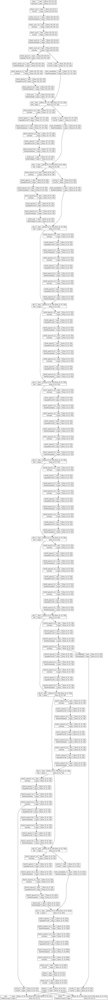

In [28]:
tf.keras.utils.plot_model(model,show_shapes=True,show_layer_names=True)

In [29]:
model.summary()

Model: "TableNet_Xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 255, 255, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 255, 255, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                 

Extracted table comparision

In [32]:
from time import strftime
import csv
def adjust(new_rows, maxi):
    """
    A function to set all with maxi number of columns
    for making csv compatible
    """
    rows = []
    for each_row in new_rows:
        if len(each_row) < maxi:
            for i in range(maxi - len(each_row)):
                each_row.append("-")
        rows.append(each_row)
    return rows

def text2csv(text):
    """
    This funtion transorms a text with newline and spaces to
    a csv that treats the spaces in the text as comma and newlines as carriage return
    """
    rows = text.split('\n')
    new_rows = []
    maxi = 0
    for each_row in rows:
        temp_row = each_row.split()
        if maxi < len(temp_row):
            maxi = len(temp_row)
        new_rows.append(temp_row)
    new_rows = adjust(new_rows, maxi)
    header = ['column_{}'.format(i) for i in range(maxi)]
    tstr = strftime("%Y%m%d-%H%M")
    temp_dir = os.path.join('output', 'temporary_files')
    if not os.path.exists(temp_dir):
        os.makedirs(temp_dir)
    temp_file = os.path.join(temp_dir, 'temp_{}.csv'.format(tstr))

    with open(temp_file, 'w') as f:
        csvwriter = csv.writer(f)
        csvwriter.writerow(header)
        csvwriter.writerows(new_rows)
    return temp_file

def extract_table(image_fname, model, show_image='off'):
    """
    Given an image and an trained tablenet model, it extracts the detected table information
    in a csv file, with the help of the trained model, to 
    """
    image_orig = Image.open(image_fname)
    original_dim = image_orig.size
    image = image_orig.resize((512,512))
    np_image = np.asarray(image)/255.0
    tab_mask, _ = model.predict(np.expand_dims(np_image, axis=0))
    
    tab_mask = np.squeeze(render(tab_mask).numpy())

    tab_mask = Image.fromarray(np.uint8(tab_mask))
    tab_mask = tab_mask.resize(original_dim)

    tab_mask = np.array(tab_mask)

    kernel_erode = np.ones((20,20), np.uint8)
    kernel = np.ones((50,50), np.uint8)
    
    tab_mask =cv2.erode(tab_mask, kernel_erode, iterations=2)


    tab_mask = cv2.morphologyEx(tab_mask, cv2.MORPH_OPEN, kernel)
    tab_mask = cv2.morphologyEx(tab_mask, cv2.MORPH_CLOSE, kernel)

    image_orig = np.array(image_orig)
    masked = cv2.bitwise_and(image_orig, image_orig, mask=tab_mask)
    # Ref: https://stackoverflow.com/questions/62813546/how-do-i-crop-an-image-based-on-custom-mask-in-python
    # transparent cropp
    tmp = cv2.cvtColor(masked, cv2.COLOR_BGR2GRAY)
    _,alpha = cv2.threshold(tmp,0,255,cv2.THRESH_BINARY)
    b, g, r = cv2.split(masked)
    rgba = [b,g,r, alpha]
    masked = cv2.merge(rgba,4)
    text = pytesseract.image_to_string(masked)
    text = text.strip()
    text = re.sub("[\r\n]+", "\r\n", text)
    csv = text2csv(text)
    model_name = model.name.split('_')[-1].lower()
    csv_fname = image_fname.split(os.path.sep)[-1].replace('png', 'csv')
    dest_dir = os.path.join('output', model_name)
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)
    dest = os.path.join(dest_dir, csv_fname)
    os.rename(csv, dest)
    if show_image == 'on':
        plt.figure(figsize=(15,20))
        plt.axis('off')
        plt.imshow(masked)
        plt.show()

In [36]:
def extract_model(weights, encoder1):
  checkpoint_dir = weights
  model = build_tablenet(encoder=encoder1)
  latest_cp = tf.train.latest_checkpoint(checkpoint_dir)
  model.load_weights(latest_cp)
  return model

VGG19

I M A G E


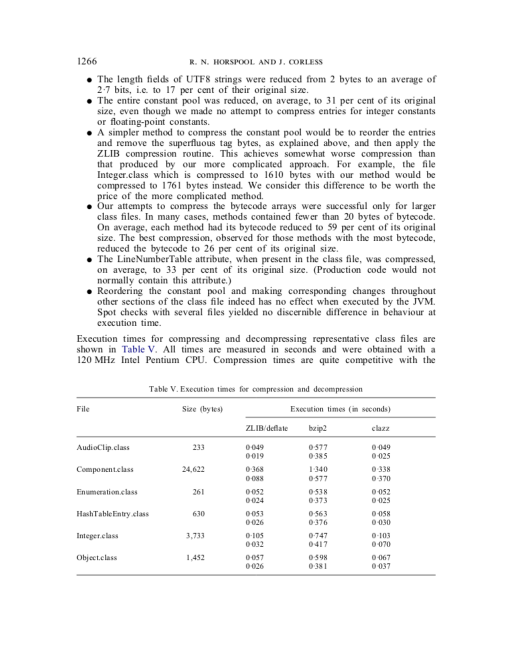

1/1 [==============================] - 0s 242ms/step


In [57]:
model = extract_model("/content/drive/MyDrive/tablenet_weights", 'VGG19')
img = Image.open('/content/data/marmot_dataset_v1.0/data/English/Positive/Raw/10.1.1.1.2047_14.bmp')
plt.figure(figsize=(10,12))
print("I M A G E")
print("="*15)
plt.axis('off')
plt.imshow(img)
plt.show()
extract_table('/content/data/marmot_dataset_v1.0/data/English/Positive/Raw/10.1.1.1.2047_14.bmp', model)

DenseNet121

In [ ]:
model = extract_table("tablenet_DenseNet_weights", 'DenseNet121')
for i in uploaded:
    img = Image.open(uploaded[i])
    plt.figure(figsize=(10,12))
    print("I M A G E")
    print("="*15)
    plt.axis('off')
    plt.imshow(img)
    plt.show()
    extract_table(uploaded[i], model)

EfficientNetB0

In [ ]:
model = extract_table("tablenet_EfficientNet_weights", 'EfficientNetB0')
for i in uploaded:
    img = Image.open(uploaded[i])
    plt.figure(figsize=(10,12))
    print("I M A G E")
    print("="*15)
    plt.axis('off')
    plt.imshow(img)
    plt.show()
    extract_table(uploaded[i], model)

ResNet50

In [ ]:
model = extract_table("tablenet_ResNet_weights", 'ResNet50')
for i in uploaded:
    img = Image.open(uploaded[i])
    plt.figure(figsize=(10,12))
    print("I M A G E")
    print("="*15)
    plt.axis('off')
    plt.imshow(img)
    plt.show()
    extract_table(uploaded[i], model)

Xception

In [ ]:
model = extract_table("tablenet_Xception_weights", 'Xception')
for i in uploaded:
    img = Image.open(uploaded[i])
    plt.figure(figsize=(10,12))
    print("I M A G E")
    print("="*15)
    plt.axis('off')
    plt.imshow(img)
    plt.show()
    extract_table(uploaded[i], model)

**Experimenting with different regularization on DenseNet121**

In [43]:
class TableConvLayer(Layer):
    def __init__(self, regularizer=None, name='table'):
        super(TableConvLayer, self).__init__(name=name)
        self.regularizer = regularizer
        self.conv7 = Conv2D(512, (1,1), activation='relu', kernel_regularizer=self.regularizer, name='conv7table')
        self.upsample_conv7 = UpSampling2D((2,2))
        self.concat_p4 = Concatenate()
        self.upsample_p4 = UpSampling2D((2,2))

        self.concat_p3 = Concatenate()
        self.upsample_p3 = UpSampling2D((2,2))

        self.upsample_p3_2 = UpSampling2D((2,2))
        self.convtranspose = Conv2DTranspose(3, (3,3), strides=2, padding='same')

    def get_config(self):
        cfg = super().get_config()
        return cfg    

    def call(self, inputs):
        X, pool3, pool4 = inputs
        X = self.conv7(X)
        X = self.upsample_conv7(X)
        
        X = self.concat_p4([X, pool4])
        X = self.upsample_p4(X)
        X = self.concat_p3([X, pool3])
        X = self.upsample_p3(X)
        X = self.upsample_p3_2(X)
        X = self.convtranspose(X)

        return X


class ColumnConvLayer(Layer):
    def __init__(self, dropout=0.4, regularizer=None, name='column'):
        super(ColumnConvLayer, self).__init__(name=name)
        self.dropout = dropout
        self.regularizer = regularizer
        self.conv7 = Conv2D(512, (1,1), activation='relu', kernel_regularizer=self.regularizer, name='conv7column')
        self.dropout = Dropout(self.dropout)
        self.conv8 = Conv2D(512, (1,1), activation='relu', kernel_regularizer=self.regularizer, name='conv8column')
        self.upsample_conv8 = UpSampling2D((2,2))
        self.concat_p4 = Concatenate()
        self.upsample_p4 = UpSampling2D((2,2))

        self.concat_p3 = Concatenate()
        self.upsample_p3 = UpSampling2D((2,2))

        self.upsample_p3_2 = UpSampling2D((2,2))
        self.convtranspose = Conv2DTranspose(3, (3,3), strides=2, padding='same')

    def get_config(self):
        cfg = super().get_config()
        return cfg    


    def call(self, inputs):
        X, pool3, pool4 = inputs
        X = self.conv7(X)
        X = self.dropout(X)
        X = self.conv8(X)
        X = self.upsample_conv8(X)
        X = self.concat_p4([X, pool4])
        X = self.upsample_p4(X)
        X = self.concat_p3([X, pool3])
        X = self.upsample_p3(X)
        X = self.upsample_p3_2(X)
        X = self.convtranspose(X)

        return X


def build_tablenet(encoder='VGG19', dropout=0.4, freeze_encoder=False, regularizer=None):
    tf.keras.backend.clear_session()
    input_shape = (512,512,3)

    if encoder == 'VGG19':
        encoder_dict = {
            'base' : VGG19,
            'end_layers' :  ['block3_pool', 'block4_pool', 'block5_pool']
        }


    elif encoder == 'DenseNet121':
        encoder_dict = {
            'base' : DenseNet121,
            'end_layers' : ['pool3_pool','pool4_pool', 'relu']
        }

    elif encoder == 'EfficientNetB0':
        encoder_dict = {
            'base' : EfficientNetB0,
            'end_layers' : ['block5c_add','block6d_add', 'top_activation']
        }
    
    elif encoder == 'Xception':
        encoder_dict = {
            'base' : Xception,
            'end_layers' : ['block10_sepconv2_act','block12_sepconv2_act', 'block14_sepconv2_act']
        }

    elif encoder == 'ResNet50':
        encoder_dict = {
            'base' : ResNet50,
            'end_layers' : ['conv3_block4_3_conv','conv4_block6_3_conv', 'conv5_block3_out']
        }
    
    else:
        raise ValueError("Value of encoder must belong from [VGG19, DenseNet121, EfficientNetB0, Xception]")
    
    
    base = encoder_dict['base'](input_shape=input_shape, include_top=False, weights='imagenet')

    if freeze_encoder:
        for layer in base.layers[:53]:
            layer.trainable = False



    end_layers = [base.get_layer(i).output for i in encoder_dict['end_layers']]

    X = Conv2D(512, (1,1), activation='relu', kernel_regularizer=regularizer, name='block6_conv1', )(end_layers[-1])
    X = Dropout(dropout)(X)
    X = Conv2D(512, (1,1), activation='relu', kernel_regularizer=regularizer, name='block6_conv2')(X)
    X = Dropout(dropout)(X)

    if encoder == 'VGG19':
        Y = end_layers[0]
        Z = end_layers[1]

    elif encoder == 'ResNet50':
        Y = Conv2D(256, (1,1))(end_layers[0])
        Z = Conv2D(512, (1,1))(end_layers[1])

    elif encoder == 'DenseNet121':
        Y = UpSampling2D((2,2))(end_layers[0])
        Z = UpSampling2D((2,2))(end_layers[1])  
    

    elif encoder == 'EfficientNetB0':
        Y = UpSampling2D((2,2))(end_layers[0])
        Y = Conv2D(256, (1,1))(Y)
        Z = UpSampling2D((2,2))(end_layers[1])
        Z = Conv2D(512, (1,1))(Z)

    
    elif encoder == 'Xception':
        Y = UpSampling2D((2,2))(end_layers[0])
        Y = Conv2D(256, (1,1))(Y)
        Z = Conv2D(512, (1,1))(end_layers[1])


    
    table_branch = TableConvLayer(regularizer)([X, Y, Z])
    column_branch = ColumnConvLayer(dropout, regularizer)([X, Y, Z])

    model = Model(inputs=base.input, outputs=[table_branch, column_branch], name='TableNet_' + encoder)

    losses = {
        "table": tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        "column": tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    }

    lossWeights = {"table": 1.0, "column": 1.0}
    optim = tf.keras.optimizers.Adam(learning_rate=0.0001, epsilon=1e-08)
    sc_acc = tf.keras.metrics.SparseCategoricalAccuracy(name='sc_accuracy')


    model.compile(optimizer = optim,
                loss = losses,
                metrics = [sc_acc],
                loss_weights = lossWeights)
    return model

Dropout= 0.6 || No-regularization || Freezing layers in encoder (Upto Block2)

In [45]:
model = build_tablenet(encoder='DenseNet121', dropout=0.6, freeze_encoder=True)
callbacks = call_back("/content/drive/MyDrive/DenseNet_d6e-1EF_weights/cp_{epoch:04d}_{val_loss:.4f}.ckpt", "DenseNet_d6e-1EF_logs")
model.fit(
    train_dataset, epochs=15,
    steps_per_epoch= STEPS_PER_EPOCH,
    validation_data=val_dataset,
    validation_steps= VALIDATION_STEPS,
    callbacks=callbacks
)

Epoch 1/15


444/444 [==============================] - ETA: 0s - loss: 0.5232 - table_loss: 0.2951 - column_loss: 0.2281 - table_sc_accuracy: 0.8822 - column_sc_accuracy: 0.9017
Epoch 1: val_loss improved from inf to 0.66253, saving model to /content/drive/MyDrive/DenseNet_d6e-1EF_weights/cp_0001_0.6625.ckpt
444/444 [==============================] - 78s 134ms/step - loss: 0.5232 - table_loss: 0.2951 - column_loss: 0.2281 - table_sc_accuracy: 0.8822 - column_sc_accuracy: 0.9017 - val_loss: 0.6625 - val_table_loss: 0.3218 - val_column_loss: 0.3407 - val_table_sc_accuracy: 0.8923 - val_column_sc_accuracy: 0.8748 - lr: 1.0000e-04
Epoch 2/15
444/444 [==============================] - ETA: 0s - loss: 0.3037 - table_loss: 0.1674 - column_loss: 0.1363 - table_sc_accuracy: 0.9370 - column_sc_accuracy: 0.9353
Epoch 2: val_loss improved from 0.66253 to 0.38467, saving model to /content/drive/MyDrive/DenseNet_d6e-1EF_weights/cp_0002_0.3847.ckpt
444/444 [==============================] - 65s 130ms/step - loss

Dropout= 0.6 || regularization L1 = 0.1, L2 = 0.1 || Freezing layers in encoder (Upto Block2)

In [46]:
reg = tf.keras.regularizers.L1L2(l1=0.1, l2=0.1)
model = build_tablenet(encoder='DenseNet121', dropout=0.6, regularizer=reg, freeze_encoder=True)
callbacks = call_back("/content/drive/MyDrive/DenseNet_d6e-1_L11e-1L21e-1_EF_weights/cp_{epoch:04d}_{val_loss:.4f}.ckpt", "DenseNet_d6e-1_L11e-1L21e-1_EF_logs")
model.fit(
    train_dataset, epochs=15,
    steps_per_epoch= STEPS_PER_EPOCH,
    validation_data=val_dataset,
    validation_steps= VALIDATION_STEPS,
    callbacks=callbacks
)

Epoch 1/15
444/444 [==============================] - ETA: 0s - loss: 3027.3110 - table_loss: 0.3089 - column_loss: 0.2607 - table_sc_accuracy: 0.8788 - column_sc_accuracy: 0.8919
Epoch 1: val_loss improved from inf to 914.30518, saving model to /content/drive/MyDrive/DenseNet_d6e-1_L11e-1L21e-1_EF_weights/cp_0001_914.3052.ckpt
444/444 [==============================] - 77s 134ms/step - loss: 3027.3110 - table_loss: 0.3089 - column_loss: 0.2607 - table_sc_accuracy: 0.8788 - column_sc_accuracy: 0.8919 - val_loss: 914.3052 - val_table_loss: 0.1866 - val_column_loss: 0.1614 - val_table_sc_accuracy: 0.9231 - val_column_sc_accuracy: 0.9233 - lr: 1.0000e-04
Epoch 2/15
444/444 [==============================] - ETA: 0s - loss: 221.0760 - table_loss: 0.1723 - column_loss: 0.1364 - table_sc_accuracy: 0.9353 - column_sc_accuracy: 0.9357
Epoch 2: val_loss improved from 914.30518 to 2.26439, saving model to /content/drive/MyDrive/DenseNet_d6e-1_L11e-1L21e-1_EF_weights/cp_0002_2.2644.ckpt
444/444 [

Dropout= 0.7 || regularization L1 = 0.1, L2 = 0.1 || No Freezing layers in encoder

In [47]:
reg = tf.keras.regularizers.L1L2(l1=0.1, l2=0.1)
model = build_tablenet(encoder='DenseNet121', dropout=0.75, regularizer=reg, freeze_encoder=False)
callbacks = call_back("/content/drive/MyDrive/DenseNet_d7e-1_L11e-1L21e-1_weights/cp_{epoch:04d}_{val_loss:.4f}.ckpt", "DenseNet_d7e-1_L11e-1L21e-1_logs")
model.fit(
    train_dataset, epochs=15,
    steps_per_epoch= STEPS_PER_EPOCH,
    validation_data=val_dataset,
    validation_steps= VALIDATION_STEPS,
    callbacks=callbacks
)

Epoch 1/15
444/444 [==============================] - ETA: 0s - loss: 3022.9746 - table_loss: 0.3283 - column_loss: 0.2730 - table_sc_accuracy: 0.8731 - column_sc_accuracy: 0.8884
Epoch 1: val_loss improved from inf to 913.26202, saving model to /content/drive/MyDrive/DenseNet_d7e-1_L11e-1L21e-1_weights/cp_0001_913.2620.ckpt
444/444 [==============================] - 86s 153ms/step - loss: 3022.9746 - table_loss: 0.3283 - column_loss: 0.2730 - table_sc_accuracy: 0.8731 - column_sc_accuracy: 0.8884 - val_loss: 913.2620 - val_table_loss: 0.4335 - val_column_loss: 0.2970 - val_table_sc_accuracy: 0.7614 - val_column_sc_accuracy: 0.8681 - lr: 1.0000e-04
Epoch 2/15
444/444 [==============================] - ETA: 0s - loss: 220.6806 - table_loss: 0.1804 - column_loss: 0.1425 - table_sc_accuracy: 0.9315 - column_sc_accuracy: 0.9328
Epoch 2: val_loss improved from 913.26202 to 2.36898, saving model to /content/drive/MyDrive/DenseNet_d7e-1_L11e-1L21e-1_weights/cp_0002_2.3690.ckpt
444/444 [======

extracted output

In [49]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 20 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [50]:
import pytesseract
import shutil
import os
import random
try:
 from PIL import Image
except ImportError:
 import Image

In [51]:
model = build_tablenet(encoder='DenseNet121', dropout=0.6)
checkpoint_dir = "/content/drive/MyDrive/DenseNet_d6e-1EF_weights"
latest_cp = tf.train.latest_checkpoint(checkpoint_dir)
model.load_weights(latest_cp)

In [53]:
import re

In [54]:
images = os.listdir(os.path.join('/content/data/ICDAR 2017/Images'))[:20]

for i in tqdm(images):
    img_fname = os.path.join('/content/data/ICDAR 2017/Images', i)
    extract_table(img_fname, model)

  0%|          | 0/20 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 1/20 [00:01<00:22,  1.20s/it]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 2/20 [00:01<00:15,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 3/20 [00:02<00:14,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 4/20 [00:03<00:12,  1.29it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 5/20 [00:03<00:11,  1.35it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 6/20 [00:04<00:09,  1.44it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 7/20 [00:05<00:08,  1.49it/s]

1/1 [==============================] - 0s 47ms/step


 40%|████      | 8/20 [00:05<00:08,  1.49it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 9/20 [00:10<00:20,  1.85s/it]

1/1 [==============================] - 0s 42ms/step


 50%|█████     | 10/20 [00:12<00:21,  2.10s/it]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 11/20 [00:13<00:14,  1.67s/it]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 12/20 [00:14<00:10,  1.37s/it]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 13/20 [00:15<00:08,  1.16s/it]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14/20 [00:15<00:05,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 15/20 [00:16<00:04,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 16/20 [00:17<00:04,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 17/20 [00:18<00:02,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 18/20 [00:22<00:03,  1.87s/it]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 19/20 [00:23<00:01,  1.65s/it]

1/1 [==============================] - 0s 37ms/step


100%|██████████| 20/20 [00:24<00:00,  1.21s/it]


I M A G E


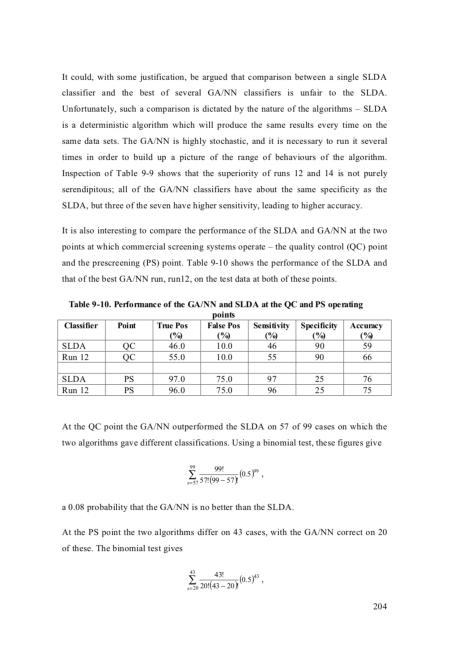

1/1 [==============================] - 0s 26ms/step


In [58]:
img_fname = os.path.join('/content/data/ICDAR 2017/Images/POD_1066.bmp')
img = Image.open(img_fname)
plt.figure(figsize=(10,12))
print("I M A G E")
print("="*15)
plt.axis('off')
plt.imshow(img)
plt.show()
extract_table(img_fname, model)